### Summary of Notebook
This notebook details the hyperparameter tuning, training and evlaluation processes for the newly proposed MobileNet_V3_Small_Quadrant (refer to the implementation details in /utils/NNModules) on the flowers102 dataset. The tuning is conducted using Ray Tune alongside PyTorch to optimize the performance of these models.

In [8]:
import torchvision
from torchvision import datasets, transforms
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision.models import mobilenet_v3_small
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import ray
from ray import tune
from ray import train
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler
from ray.train import Checkpoint, get_checkpoint
import ray.cloudpickle as pickle
from functools import partial
import os
import sys
import tempfile
working_dir = "C:/Users/fooji/OneDrive/School/Y4S1/FYP/FYP"
sys.path.append(working_dir)
from utils.NNModules import MobileNetV3Small, MobileNetV3SmallQuadrant
from utils.model_training import train_model

### Set Up
Here, we will begin by initialising the ray module and setting the working directory as the root directory of the repository.

In [2]:
ray.shutdown()
ray.init(runtime_env={"working_dir":working_dir,
                      "excludes": ["/data"]
})

2024-09-09 18:55:04,391	INFO worker.py:1783 -- Started a local Ray instance.
2024-09-09 18:55:04,462	INFO packaging.py:530 -- Creating a file package for local directory 'C:/Users/fooji/OneDrive/School/Y4S1/FYP/FYP'.
2024-09-09 18:55:04,530	INFO packaging.py:358 -- Pushing file package 'gcs://_ray_pkg_68965675f5e28ad4.zip' (0.05MiB) to Ray cluster...
2024-09-09 18:55:04,536	INFO packaging.py:371 -- Successfully pushed file package 'gcs://_ray_pkg_68965675f5e28ad4.zip'.


Python version:,3.10.12
Ray version:,2.35.0


We will create a function to retrieve the flowers102 dataset and do the necessary transformations

In [2]:
def load_data(data_dir="./../../../../data/flowers"):
    data_transforms = {
        'train': transforms.Compose([
            transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'val': transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        'test': transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }
    train_dataset = torchvision.datasets.Flowers102(data_dir + "/train", split="train", download=True, transform=data_transforms["train"])
    val_dataset = torchvision.datasets.Flowers102(data_dir + "/val", split="val", download=True, transform=data_transforms["val"])
    test_dataset = torchvision.datasets.Flowers102(data_dir + "/test", split="test", download=True, transform=data_transforms["test"])
    return train_dataset, val_dataset, test_dataset

### Hyperparamater Tuning

The following section performs comprehensive hyperparameter tuning according to the user-provided configuration for the chosen model.

In [4]:
def train_flowers(config, model_name, data_dir=None):
    train_dataset, val_dataset, _= load_data(data_dir)
    model = None
    if model_name == "MobileNetV3Small":
        model = MobileNetV3Small(num_classes=102)
    elif model_name == "MobileNetV3SmallQuadrant":
        model = MobileNetV3SmallQuadrant(num_classes=102)
    else:
        raise ValueError(f"Model {model_name} is not implemented. Supported models are 'MobileNetV3Small' and 'MobileNetV3SmallQuadrant'.")
    device = "cpu"
    if torch.cuda.is_available():
        device="cuda:0"
    model.to(device)
    criterion = torch.nn.CrossEntropyLoss(reduction='sum')
    optimizer = torch.optim.SGD(model.parameters(), lr=config["lr"], momentum=0.9)
    checkpoint = get_checkpoint()
    if checkpoint:
        with checkpoint.as_directory() as checkpoint_dir:
            data_path = Path(checkpoint_dir) / "data.pkl"
            with open(data_path, "rb") as fp:
                checkpoint_state = pickle.load(fp)
            start_epoch = checkpoint_state["epoch"]
            model.load_state_dict(checkpoint_state["model_state_dict"])
            optimizer.load_state_dict(checkpoint_state["optimizer_state_dict"])
    else:
        start_epoch = 0
    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=config["batch_size"], shuffle=True)
    val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=config["batch_size"], shuffle=True)
    for epoch in range(30):
        train_running_loss = 0.0
        train_correct = 0
        model.train()
        with torch.autograd.set_detect_anomaly(True):
            for i, data in enumerate(train_dataloader):
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(inputs)
                _, preds = torch.max(outputs,1)
                train_correct += torch.sum(preds==labels.data)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                train_running_loss += loss.item()
        print(f'Train Loss: {train_running_loss/len(train_dataloader.dataset):.4f} Acc: {train_correct/len(train_dataloader.dataset):.4f}')
        val_running_loss = 0.0
        val_correct = 0
        model.eval()
        for i, data in enumerate(val_dataloader):
            with torch.no_grad():
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_correct += torch.sum(preds==labels.data)
                loss = criterion(outputs, labels)
                val_running_loss += loss.item()
        checkpoint_data = {
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
        }
        with tempfile.TemporaryDirectory() as checkpoint_dir:
            data_path = Path(checkpoint_dir) / "data.pkl"
            with open(data_path, "wb") as fp:
                pickle.dump(checkpoint_data, fp)

            checkpoint = Checkpoint.from_directory(checkpoint_dir)
            train.report(
                {"loss": val_running_loss / len(val_dataloader.dataset), "accuracy": float(val_correct / len(val_dataloader.dataset))},
                checkpoint=checkpoint,
            )
    print("Finished Training")

In [10]:
def test_accuracy(model, device="cpu"):
    _, _, test_dataset= load_data()
    correct = 0
    test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=False)
    model.eval()
    with torch.no_grad():
        for data in test_dataloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            correct += torch.sum(preds == labels.data)
    print(f"Number of correct preds: {correct}")
    print(f"Test dataset total rows: {len(test_dataloader.dataset)}")
    return float(correct/len(test_dataloader.dataset))

In [6]:
def main(model_name, num_samples=8, max_num_epochs=30, gpus_per_trial=0):
    data_dir = os.path.abspath("./../../../../data/flowers")
    config={
        "lr":tune.loguniform(1e-4, 1e-3),
        "batch_size": tune.choice([16,32])
    }
    scheduler = ASHAScheduler(
        metric="loss",
        mode="min",
        max_t=max_num_epochs,
        grace_period=2,
        reduction_factor=2
    )
    reporter = CLIReporter(
        metric_columns=["loss", "accuracy", "training_iteration"]
    )
    result = tune.run(
        partial(train_flowers, model_name=model_name, data_dir=data_dir),
        resources_per_trial = {"cpu":2, "gpu":gpus_per_trial},
        config=config,
        num_samples = num_samples,
        scheduler=scheduler,
        progress_reporter=reporter
    )
    best_trial = result.get_best_trial("loss", "min", "last")
    print(f"Best Trial Config: {best_trial.config}")
    print(f"Best Trial Final Validation Loss: {best_trial.last_result['loss']}")
    print(f"Best Trial Final Validation Accuracy: {best_trial.last_result['accuracy']}")
    best_trained_model = None
    if model_name == "MobileNetV3Small":
        best_trained_model = MobileNetV3Small(num_classes=102)
    elif model_name == "MobileNetV3SmallQuadrant":
        best_trained_model = MobileNetV3SmallQuadrant(num_classes=102)
    else:
        raise ValueError(f"Model {model_name} is not implemented. Supported models are 'MobileNetV3Small' and 'MobileNetV3SmallQuadrant'.")
    device="cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
    best_trained_model.to(device)
    best_checkpoint = result.get_best_checkpoint(trial=best_trial, metric="accuracy", mode="max")
    with best_checkpoint.as_directory() as checkpoint_dir:
        data_path = Path(checkpoint_dir) / "data.pkl"
        print(f"This is the best checkpoint path {data_path}")
    with open(data_path, "rb") as fp:
        best_checkpoint_data = pickle.load(fp)
    best_trained_model.load_state_dict(best_checkpoint_data["model_state_dict"])
    test_acc = test_accuracy(best_trained_model, device)
    print("Best Trial Test Set Accuracy: {}".format(test_acc))

In [7]:
# hyperparam tuning for MobileNetV3SmallQuadrant
main(model_name="MobileNetV3SmallQuadrant", num_samples=16, max_num_epochs=25, gpus_per_trial=0)

2024-09-09 18:55:19,679	INFO tune.py:616 -- [output] This uses the legacy output and progress reporter, as Jupyter notebooks are not supported by the new engine, yet. For more information, please see https://github.com/ray-project/ray/issues/36949


== Status ==
Current time: 2024-09-09 18:55:20 (running for 00:00:00.49)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 16.000: None | Iter 8.000: None | Iter 4.000: None | Iter 2.000: None
Logical resource usage: 0/8 CPUs, 0/0 GPUs
Result logdir: C:/Users/fooji/AppData/Local/Temp/ray/session_2024-09-09_18-55-01_167056_18296/artifacts/2024-09-09_18-55-19/train_flowers_2024-09-09_18-55-19/driver_artifacts
Number of trials: 16/16 (16 PENDING)
+---------------------------+----------+-------+--------------+-------------+
| Trial name                | status   | loc   |   batch_size |          lr |
|---------------------------+----------+-------+--------------+-------------|
| train_flowers_0143a_00000 | PENDING  |       |           16 | 0.000153759 |
| train_flowers_0143a_00001 | PENDING  |       |           32 | 0.000194081 |
| train_flowers_0143a_00002 | PENDING  |       |           32 | 0.000172361 |
| train_flowers_0143a_00003 | PENDING  |       |           16 | 0.000410382 |
| trai

(func pid=16932) Train Loss: 6.9339 Acc: 0.0167
(func pid=5068) Train Loss: 6.7673 Acc: 0.0157 [repeated 2x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options.)


Trial name,accuracy,loss,should_checkpoint
train_flowers_0143a_00000,0.764706,0.909676,True
train_flowers_0143a_00001,0.727451,1.24306,True
train_flowers_0143a_00002,0.0205882,8.28108,True
train_flowers_0143a_00003,0.0431373,6.59978,True
train_flowers_0143a_00004,0.17549,4.67769,True
train_flowers_0143a_00005,0.755882,1.04844,True
train_flowers_0143a_00006,0.00686275,105.606,True
train_flowers_0143a_00007,0.183333,4.1584,True
train_flowers_0143a_00008,0.0117647,544.94,True
train_flowers_0143a_00009,0.506863,2.01332,True


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000000)
(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000000) [repeated 2x across cluster]


== Status ==
Current time: 2024-09-09 19:01:08 (running for 00:05:48.91)
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 16.000: None | Iter 8.000: None | Iter 4.000: None | Iter 2.000: None
Logical resource usage: 8.0/8 CPUs, 0/0 GPUs
Result logdir: C:/Users/fooji/AppData/Local/Temp/ray/session_2024-09-09_18-55-01_167056_18296/artifacts/2024-09-09_18-55-19/train_flowers_2024-09-09_18-55-19/driver_artifacts
Number of trials: 16/16 (12 PENDING, 4 RUNNING)
+---------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|---------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_flowers_0143a_00000 | RUNNING  | 127.0.0.1:5068  |           16 | 0.000153759 |         |            |                      |
| t

(func pid=16932) Train Loss: 4.4078 Acc: 0.1127 [repeated 2x across cluster]


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000001) [repeated 2x across cluster]


(func pid=5068) Train Loss: 4.6144 Acc: 0.0784 [repeated 2x across cluster]


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000001) [repeated 2x across cluster]


(func pid=16932) Train Loss: 3.5030 Acc: 0.2255 [repeated 2x across cluster]
(func pid=12132) Train Loss: 6.9892 Acc: 0.0186


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000002) [repeated 2x across cluster]
(func pid=12132) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00004_4_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000000)


(func pid=5068) Train Loss: 3.6829 Acc: 0.1873
(func pid=14552) Train Loss: 6.7203 Acc: 0.0157


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000002)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000000)


(func pid=16932) Train Loss: 2.7864 Acc: 0.3451
(func pid=12132) Train Loss: 4.4923 Acc: 0.0961


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000003)
(func pid=12132) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00004_4_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000001)


(func pid=5068) Train Loss: 2.9610 Acc: 0.3078
(func pid=14552) Train Loss: 4.5170 Acc: 0.0882


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000003)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000001)


(func pid=16932) Train Loss: 2.3584 Acc: 0.4147
(func pid=12132) Train Loss: 3.5206 Acc: 0.2176


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000004)
(func pid=12132) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00004_4_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000002)


(func pid=5068) Train Loss: 2.4383 Acc: 0.4039
(func pid=14552) Train Loss: 3.7178 Acc: 0.1755


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000004)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000002)


(func pid=16932) Train Loss: 1.8828 Acc: 0.5363
(func pid=12132) Train Loss: 2.8400 Acc: 0.3373


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000005)
(func pid=12132) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00004_4_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000003)


(func pid=5068) Train Loss: 2.1170 Acc: 0.4853
(func pid=14552) Train Loss: 2.9416 Acc: 0.3137


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000005)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000003)


(func pid=16932) Train Loss: 1.6577 Acc: 0.5971


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000006)


(func pid=18180) Train Loss: 6.0035 Acc: 0.0216


(func pid=18180) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00006_6_batch_size=32,lr=0.0008_2024-09-09_18-55-19/checkpoint_000000)


(func pid=5068) Train Loss: 1.8579 Acc: 0.5147
(func pid=14552) Train Loss: 2.5476 Acc: 0.3912
(func pid=16932) Train Loss: 1.4291 Acc: 0.6382


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000006)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000004)
(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000007)


(func pid=18180) Train Loss: 4.2730 Acc: 0.1078


(func pid=18180) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00006_6_batch_size=32,lr=0.0008_2024-09-09_18-55-19/checkpoint_000001)


(func pid=16932) Train Loss: 1.2935 Acc: 0.6716
(func pid=14552) Train Loss: 2.1569 Acc: 0.4618 [repeated 2x across cluster]


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000008)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000005) [repeated 2x across cluster]


(func pid=8296) Train Loss: 6.3586 Acc: 0.0176


(func pid=8296) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00007_7_batch_size=16,lr=0.0003_2024-09-09_18-55-19/checkpoint_000000)


(func pid=16932) Train Loss: 1.0424 Acc: 0.7216


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000009)


(func pid=5068) Train Loss: 1.4994 Acc: 0.6216
(func pid=14552) Train Loss: 1.8096 Acc: 0.5618


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000008)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000006)


(func pid=8296) Train Loss: 4.2988 Acc: 0.1029


(func pid=8296) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00007_7_batch_size=16,lr=0.0003_2024-09-09_18-55-19/checkpoint_000001)


(func pid=16932) Train Loss: 0.8995 Acc: 0.7637


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000010)


(func pid=5068) Train Loss: 1.3021 Acc: 0.6637
(func pid=14552) Train Loss: 1.6597 Acc: 0.5863


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000009)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000007)


(func pid=8296) Train Loss: 3.6024 Acc: 0.2078


(func pid=8296) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00007_7_batch_size=16,lr=0.0003_2024-09-09_18-55-19/checkpoint_000002)


(func pid=16932) Train Loss: 0.8639 Acc: 0.7608


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000011)


(func pid=5068) Train Loss: 1.0852 Acc: 0.6902
(func pid=14552) Train Loss: 1.3961 Acc: 0.6402


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000010)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000008)


(func pid=8296) Train Loss: 2.9404 Acc: 0.2961


(func pid=8296) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00007_7_batch_size=16,lr=0.0003_2024-09-09_18-55-19/checkpoint_000003)


(func pid=16932) Train Loss: 0.7793 Acc: 0.7941


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000012)


(func pid=5068) Train Loss: 1.0433 Acc: 0.7343
(func pid=14552) Train Loss: 1.4181 Acc: 0.6167
(func pid=14552) 


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000011)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000009)


(func pid=18760) Train Loss: 6.0204 Acc: 0.0225
(func pid=16932) Train Loss: 0.7082 Acc: 0.8108


(func pid=18760) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00008_8_batch_size=32,lr=0.0009_2024-09-09_18-55-19/checkpoint_000000)
(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000013)


(func pid=5068) Train Loss: 0.9091 Acc: 0.7637
(func pid=14552) Train Loss: 1.1093 Acc: 0.7176


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000012)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000010)


(func pid=18760) Train Loss: 4.3574 Acc: 0.0784
(func pid=16932) Train Loss: 0.7663 Acc: 0.7902


(func pid=18760) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00008_8_batch_size=32,lr=0.0009_2024-09-09_18-55-19/checkpoint_000001)
(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000014)


(func pid=5068) Train Loss: 0.8081 Acc: 0.7980
(func pid=14552) Train Loss: 1.0614 Acc: 0.7235


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000013)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000011)


(func pid=16932) Train Loss: 0.5865 Acc: 0.8431
(func pid=5620) Train Loss: 6.7528 Acc: 0.0137


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000015)
(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000000)


(func pid=5068) Train Loss: 0.7835 Acc: 0.7902
(func pid=14552) Train Loss: 0.8975 Acc: 0.7618


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000014)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000012)


(func pid=5620) Train Loss: 4.5108 Acc: 0.0804 [repeated 2x across cluster]


(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000001) [repeated 2x across cluster]


(func pid=16932) Train Loss: 0.5902 Acc: 0.8529
(func pid=5068) Train Loss: 0.7743 Acc: 0.7931
(func pid=14552) Train Loss: 0.8497 Acc: 0.7794


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000017)
(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000015)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000013)


(func pid=5620) Train Loss: 3.6053 Acc: 0.1902


(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000002)


(func pid=16932) Train Loss: 0.4622 Acc: 0.8647


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000018)


(func pid=5068) Train Loss: 0.7619 Acc: 0.7971
(func pid=14552) Train Loss: 0.8072 Acc: 0.7833


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000016)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000014)


(func pid=5620) Train Loss: 2.9312 Acc: 0.3363


(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000003)


(func pid=16932) Train Loss: 0.4480 Acc: 0.8824


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000019)


(func pid=5068) Train Loss: 0.7032 Acc: 0.8069
(func pid=14552) Train Loss: 0.8034 Acc: 0.7961


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000017)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000015)


(func pid=5620) Train Loss: 2.4290 Acc: 0.4010


(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000004)


(func pid=16932) Train Loss: 0.4374 Acc: 0.8784


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000020)


(func pid=5068) Train Loss: 0.6204 Acc: 0.8363
(func pid=14552) Train Loss: 0.7389 Acc: 0.7941


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000018)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000016)


(func pid=5620) Train Loss: 1.9725 Acc: 0.5127


(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000005)


(func pid=16932) Train Loss: 0.4445 Acc: 0.8775


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000021)


(func pid=5068) Train Loss: 0.6707 Acc: 0.8353
(func pid=14552) Train Loss: 0.6656 Acc: 0.8294


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000019)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000017)


(func pid=5620) Train Loss: 1.8090 Acc: 0.5490
(func pid=16932) Train Loss: 0.4613 Acc: 0.8676


(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000006)
(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000022)


(func pid=5068) Train Loss: 0.6436 Acc: 0.8392
(func pid=14552) Train Loss: 0.6556 Acc: 0.8373


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000020)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000018)


(func pid=16932) Train Loss: 0.3701 Acc: 0.9059
(func pid=5620) Train Loss: 1.5569 Acc: 0.6127


(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000023)
(func pid=5620) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00009_9_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000007)


(func pid=5068) Train Loss: 0.5412 Acc: 0.8569
(func pid=14552) Train Loss: 0.5431 Acc: 0.8520


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000021)


(func pid=16932) Train Loss: 0.3976 Acc: 0.8931


(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000019)
(func pid=16932) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00001_1_batch_size=32,lr=0.0002_2024-09-09_18-55-19/checkpoint_000024)


(func pid=20312) Train Loss: 7.1566 Acc: 0.0118


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000000)


(func pid=5068) Train Loss: 0.4962 Acc: 0.8745
(func pid=14552) Train Loss: 0.5727 Acc: 0.8441


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000022)


(func pid=12764) Train Loss: 7.4934 Acc: 0.0118


(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000020)
(func pid=12764) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00011_11_batch_size=32,lr=0.0001_2024-09-09_18-55-19/checkpoint_000000)


(func pid=20312) Train Loss: 4.8402 Acc: 0.0735


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000001)


(func pid=5068) Train Loss: 0.4669 Acc: 0.8755
(func pid=14552) Train Loss: 0.5457 Acc: 0.8451 [repeated 2x across cluster]


(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000023)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000021) [repeated 2x across cluster]


(func pid=20312) Train Loss: 4.0069 Acc: 0.1441


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000002)


(func pid=12132) Train Loss: 7.6011 Acc: 0.0088
(func pid=5068) Train Loss: 0.5044 Acc: 0.8549
(func pid=14552) Train Loss: 0.5123 Acc: 0.8637


(func pid=12132) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00012_12_batch_size=32,lr=0.0001_2024-09-09_18-55-19/checkpoint_000000)
(func pid=5068) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00000_0_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000024)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000022)


(func pid=20312) Train Loss: 3.3806 Acc: 0.2265


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000003)


(func pid=12132) Train Loss: 4.9409 Acc: 0.0618
(func pid=16208) Train Loss: 6.2031 Acc: 0.0196


(func pid=12132) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00012_12_batch_size=32,lr=0.0001_2024-09-09_18-55-19/checkpoint_000001)


(func pid=14552) Train Loss: 0.5638 Acc: 0.8392


(func pid=16208) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00013_13_batch_size=32,lr=0.0006_2024-09-09_18-55-19/checkpoint_000000)
(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000023)


(func pid=20312) Train Loss: 2.8680 Acc: 0.3304


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000004)


(func pid=16208) Train Loss: 4.3842 Acc: 0.0794
(func pid=4980) Train Loss: 6.0884 Acc: 0.0343


(func pid=16208) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00013_13_batch_size=32,lr=0.0006_2024-09-09_18-55-19/checkpoint_000001)
(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000000)


(func pid=14552) Train Loss: 0.4966 Acc: 0.8696


(func pid=14552) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00005_5_batch_size=16,lr=0.0002_2024-09-09_18-55-19/checkpoint_000024)


(func pid=20312) Train Loss: 2.6131 Acc: 0.3794


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000005)


(func pid=14916) Train Loss: 6.4693 Acc: 0.0206


(func pid=14916) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00015_15_batch_size=32,lr=0.0004_2024-09-09_18-55-20/checkpoint_000000)


(func pid=4980) Train Loss: 4.0415 Acc: 0.1324


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000001)


(func pid=20312) Train Loss: 2.2324 Acc: 0.4500


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000006)


(func pid=14916) Train Loss: 4.3720 Acc: 0.0824


(func pid=14916) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00015_15_batch_size=32,lr=0.0004_2024-09-09_18-55-20/checkpoint_000001)


(func pid=4980) Train Loss: 3.0813 Acc: 0.2735


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000002)


(func pid=20312) Train Loss: 1.9972 Acc: 0.5225


(func pid=20312) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00010_10_batch_size=16,lr=0.0001_2024-09-09_18-55-19/checkpoint_000007)


(func pid=4980) Train Loss: 2.3782 Acc: 0.4039


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000003)


(func pid=4980) Train Loss: 2.0463 Acc: 0.4804


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000004)


(func pid=4980) Train Loss: 1.6215 Acc: 0.5824


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000005)


(func pid=4980) Train Loss: 1.4270 Acc: 0.6225


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000006)


(func pid=4980) Train Loss: 1.3085 Acc: 0.6637


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000007)


(func pid=4980) Train Loss: 1.0678 Acc: 0.7029


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000008)


(func pid=4980) Train Loss: 0.8990 Acc: 0.7637


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000009)


(func pid=4980) Train Loss: 0.8578 Acc: 0.7608


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000010)


(func pid=4980) Train Loss: 0.8208 Acc: 0.7637


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000011)


(func pid=4980) Train Loss: 0.7759 Acc: 0.7902


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000012)


(func pid=4980) Train Loss: 0.6737 Acc: 0.8078


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000013)


(func pid=4980) Train Loss: 0.5308 Acc: 0.8451


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000014)


(func pid=4980) Train Loss: 0.5742 Acc: 0.8412


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000015)


(func pid=4980) Train Loss: 0.5356 Acc: 0.8461


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000016)


(func pid=4980) Train Loss: 0.5861 Acc: 0.8520


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000017)


(func pid=4980) Train Loss: 0.5199 Acc: 0.8618


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000018)


(func pid=4980) Train Loss: 0.4763 Acc: 0.8676


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000019)


(func pid=4980) Train Loss: 0.4441 Acc: 0.8676


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000020)


(func pid=4980) Train Loss: 0.4525 Acc: 0.8843


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000021)


(func pid=4980) Train Loss: 0.4420 Acc: 0.8833


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000022)


(func pid=4980) Train Loss: 0.4158 Acc: 0.8804


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000023)


(func pid=4980) Train Loss: 0.3660 Acc: 0.8951


(func pid=4980) Checkpoint successfully created at: Checkpoint(filesystem=local, path=C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19/train_flowers_0143a_00014_14_batch_size=16,lr=0.0003_2024-09-09_18-55-20/checkpoint_000024)


2024-09-09 23:54:27,791	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to 'C:/Users/fooji/ray_results/train_flowers_2024-09-09_18-55-19' in 0.0421s.
2024-09-09 23:54:27,806	INFO tune.py:1041 -- Total run time: 17948.13 seconds (17948.00 seconds for the tuning loop).


== Status ==
Current time: 2024-09-09 23:54:27 (running for 04:59:08.05)
Using AsyncHyperBand: num_stopped=16
Bracket: Iter 16.000: -1.0750559800980137 | Iter 8.000: -1.9140407795999563 | Iter 4.000: -3.2391840897354425 | Iter 2.000: -6.475655944674623
Logical resource usage: 2.0/8 CPUs, 0/0 GPUs
Result logdir: C:/Users/fooji/AppData/Local/Temp/ray/session_2024-09-09_18-55-01_167056_18296/artifacts/2024-09-09_18-55-19/train_flowers_2024-09-09_18-55-19/driver_artifacts
Number of trials: 16/16 (16 TERMINATED)
+---------------------------+------------+-----------------+--------------+-------------+------------+------------+----------------------+
| Trial name                | status     | loc             |   batch_size |          lr |       loss |   accuracy |   training_iteration |
|---------------------------+------------+-----------------+--------------+-------------+------------+------------+----------------------|
| train_flowers_0143a_00000 | TERMINATED | 127.0.0.1:5068  |          

c:\Users\fooji\anaconda3\envs\fyp\lib\site-packages\torch\storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.BytesIO(b))


Number of correct preds: 4561
Test dataset total rows: 6149
Best Trial Test Set Accuracy: 0.7417466044425964


In [3]:
model = MobileNetV3SmallQuadrant(num_classes=102)
train_dataset, val_dataset, test_dataset= load_data()
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=True)
dataloaders = {"train":train_dataloader, "val":val_dataloader, "test":test_dataloader}
criterion = torch.nn.CrossEntropyLoss(reduction='sum')
optimizer = torch.optim.SGD(model.parameters(), lr=0.00015375945475476033, momentum=0.9)
# try to soft code this by getting cwd and also just needing to enter the file name
best_model_params_path = os.path.join(os.getcwd(), "best_models", "mobilenet_v3_small_quadrant.pt")
NUM_EPOCHS = 50

In [7]:
model, train_accuracies, val_accuracies = train_model(model, dataloaders, criterion, optimizer, NUM_EPOCHS, best_model_params_path)

Epoch 1/50
----------
train Loss: 6.7291 Acc: 0.0265
val Loss: 7.4162 Acc: 0.0118

Epoch 2/50
----------
train Loss: 4.4079 Acc: 0.1039
val Loss: 5.8988 Acc: 0.0265

Epoch 3/50
----------
train Loss: 3.5193 Acc: 0.2147
val Loss: 3.8682 Acc: 0.1892

Epoch 4/50
----------
train Loss: 3.0060 Acc: 0.3108
val Loss: 3.2926 Acc: 0.2696

Epoch 5/50
----------
train Loss: 2.4382 Acc: 0.4049
val Loss: 2.4513 Acc: 0.4255

Epoch 6/50
----------
train Loss: 2.1415 Acc: 0.4824
val Loss: 2.0017 Acc: 0.4931

Epoch 7/50
----------
train Loss: 1.7840 Acc: 0.5539
val Loss: 1.7317 Acc: 0.5608

Epoch 8/50
----------
train Loss: 1.5831 Acc: 0.5902
val Loss: 1.7298 Acc: 0.5657

Epoch 9/50
----------
train Loss: 1.3752 Acc: 0.6471
val Loss: 1.5575 Acc: 0.6137

Epoch 10/50
----------
train Loss: 1.3083 Acc: 0.6529
val Loss: 1.9358 Acc: 0.5402

Epoch 11/50
----------
train Loss: 1.2194 Acc: 0.6637
val Loss: 1.3613 Acc: 0.6814

Epoch 12/50
----------
train Loss: 1.0078 Acc: 0.7451
val Loss: 1.3435 Acc: 0.6716

E

C:\Users/fooji/OneDrive/School/Y4S1/FYP/FYP\utils\model_training.py:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_params_path

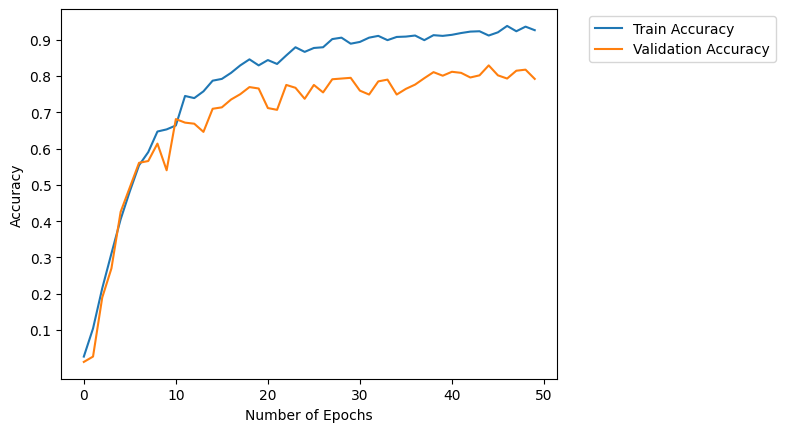

In [9]:
plt.plot(range(NUM_EPOCHS), train_accuracies, label="Train Accuracy")
plt.plot(range(NUM_EPOCHS), val_accuracies, label="Validation Accuracy")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy")

plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.yticks(np.arange(0.1, 1, 0.1))
plt.show()

In [11]:
test_accuracy(model)

Number of correct preds: 4836
Test dataset total rows: 6149


0.7864693403244019